In [33]:
from astropy.table import Table
import numpy as np
from ltsfit.ltsfit import ltsfit
from matplotlib import pyplot as plt
import corner
from utils import fit_plane, find_scatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
from ltsfit.ltsfit import ltsfit

plt.style.use("paper_style.mplstyle")

Here we make subsamples of the SLSim 20000 deg² catalog to mimic LSST-like selection functions for Single Visit, Y10, and 4MOST spectroscopic follow-up. We then analyze the number of lenses in each sample and their distributions in key parameters like lens redshift, source redshift, Einstein radius, and velocity dispersion. Then we also analyze the Fundamental Plane and Mass Fundamental Plane relations for the lenses in each sample.

## Prepare LSST like samples for Single Visit, Y10, and 4MOST 

In [4]:
########################################################
### Load the GGL data table and apply selection cuts!
########################################################

sky_area = "20000.0"
GGL_data_table = Table.read(f"../data/FULL_LSST/GGL_{sky_area}_SQDEG_NON_SIS.fits", format='fits')

contrast_mask = np.zeros(len(GGL_data_table), dtype=bool)
# ps_magnification_mask = np.zeros(len(GGL_data_table), dtype=bool)
for i in range(len(GGL_data_table)):
    
    # contrast mask
    all_vals = GGL_data_table['contrast_ratio_i'][i]
    all_vals = all_vals[~np.isnan(all_vals)]
    # get linear scale values
    all_vals = 10**(-0.4 * all_vals)
    contrast_mask[i] = np.all(all_vals > 2) # all images should have contrast ratio > 2

    # point source magnification mask
    # ps_magnifications = GGL_data_table['ps_magnification'][i]
    # ps_magnifications = ps_magnifications[~np.isnan(ps_magnifications)]
    # high_mag = np.any(np.abs(ps_magnifications) > 3)
    # ps_magnification_mask[i] = high_mag

# add a column for r_band lensed source magnitude
GGL_data_table['mag_S_r_lensed'] = GGL_data_table['mag_S_r'] - 2.5 * np.log10(np.abs(GGL_data_table['es_magnification']))
GGL_data_table['mag_S_i_lensed'] = GGL_data_table['mag_S_i'] - 2.5 * np.log10(np.abs(GGL_data_table['es_magnification']))

# add log columns
GGL_data_table['log_R_e_kpc'] = np.log10(GGL_data_table['R_e_kpc'])
GGL_data_table['log_Sigma_half_Msun/pc2'] = np.log10(GGL_data_table['Sigma_half_Msun/pc2'])
GGL_data_table['log_sigma_v_D'] = np.log10(GGL_data_table['sigma_v_D'])

GGL_data_table = GGL_data_table[ 
                                # (GGL_data_table['mag_D_i'] >= 19) & # optional, but reasonable for realistic deflectors
                                (GGL_data_table['mag_S_i_lensed'] < 28)
                                & (GGL_data_table['mag_D_i'] < 28)
                                & (contrast_mask)
                                & (np.abs(GGL_data_table['es_magnification']) > 3)
                                # & (ps_magnification_mask)
                                ]

GGL_data_table

lens_id,z_D,z_S,theta_E,sigma_v_D,stellar_mass_D,mag_S_i,mag_S_r,mag_S_g,mag_S_z,mag_S_y,mag_D_i,mag_D_r,mag_D_g,mag_D_z,mag_D_y,size_D,e1_mass_D,e2_mass_D,e_mass_D,gamma_pl,R_e_kpc,Sigma_half_Msun/pc2,surf_bri_mag/arcsec2,num_images,contrast_ratio_i,contrast_ratio_r,contrast_ratio_g,contrast_ratio_z,contrast_ratio_y,ps_magnification,es_magnification,mag_S_r_lensed,mag_S_i_lensed,log_R_e_kpc,log_Sigma_half_Msun/pc2,log_sigma_v_D
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,object,object,object,object,object,object,float64,float64,float64,float64,float64,float64
0,0.329124822435322,1.0051241911718725,0.7363886012965237,204.95721128465118,275998973063.0321,25.94413434762533,26.446866065929875,26.901160154345234,25.41608564735612,25.198691277756744,18.473213998207086,18.998168679136697,20.326978780985307,18.18745500089087,18.017140693630708,0.6211472127946348,-0.09393377584227298,-0.16505803588587262,0.18991500586970056,2.321328016088915,2.9465977208867837,8535.89328257733,21.757217663234215,2,[-2.4220773 -1.28337688 nan nan],[-2.44430027 -1.30559985 nan nan],[-3.31881628 -2.18011586 nan nan],[-2.66436701 -1.52566659 nan nan],[-2.71144707 -1.57274665 nan nan],[ 2.92207111 -1.07341961 nan nan],4.173255766980806,24.895678560426354,24.39294684212181,0.46932084860040457,3.9312489768150187,2.3116632032869937
2,1.5396965757178396,4.066533840144556,0.5933648988866821,231.10867185666163,389289198801.96466,24.900236495349702,24.922141654357382,25.763978022146283,24.725872734929496,24.683270988046196,24.41195843790899,25.130329765942452,25.30026978999013,23.730460832500615,23.255917419169965,0.28476868766254126,-0.06688414245898035,-0.07483269760643144,0.10036643434699066,1.9636670626037047,2.4116322493391453,9733.655223494123,25.046405207401236,2,[-6.91412895 -4.66572158 nan nan],[-7.61059512 -5.36218775 nan nan],[-6.93869877 -4.69029141 nan nan],[-6.4069951 -4.15858774 nan nan],[-5.97505344 -3.72664607 nan nan],[ 2.92800817 -1.97668935 nan nan],5.071634728656454,23.159271736692816,23.137366577685135,0.3823110827967278,3.988275959003662,2.363816241752744
3,0.8225987025699782,2.366507264296516,0.9668295355099917,259.62963891734057,542551704224.9811,25.42476006841597,25.666408789606926,26.01763736223713,25.216602806393354,24.925045335560704,21.013526126833924,22.171608359503182,23.605021431468003,20.288169411022842,20.01538502099843,0.4462983000792573,-0.00861094230919072,0.1274912291350796,0.1277816960046531,1.835514582302274,3.382329505014604,7244.8980947256905,24.32302122251722,2,[-4.65708854 -2.21916653 nan nan],[-5.57352205 -3.13560004 nan nan],[-6.65570655 -4.21778454 nan nan],[-4.13988909 -1.70196708 nan nan],[-4.15866217 -1.72074016 nan nan],[ 4.24962347 -1.70365791 nan nan],6.3961411913084785,23.651613684625712,23.409964963434756,0.5292159140952236,3.8600322811516294,2.4143542693436544
5,1.5171235169191208,2.5465475424063917,0.6723012778010724,303.7585859107459,810824890889.5197,25.019755560697423,25.16387716380412,25.26612378578275,25.065684701825038,24.946643206818198,23.480512006952782,24.623619500693746,25.16421667728064,22.744252502352037,22.077746297186646,0.9863277959653846,-0.11291634955715528,-0.1482659157157352,0.1863676038380576,1.9241066977496035,8.34989790387258,4966.993360524251,27.601580718709098,2,[-5.37082001 -3.52830932 nan nan],[-6.3698059 -4.52729521 nan nan],[-6.80815645 -4.96564577 nan nan],[-4.58863136 -2.74612068 nan nan],[-4.04116665 -2.19865597 nan nan],[ 4.03371445 -0.99858105 nan nan],6.800722117078591,23.082489589828263,22.938367986721566,0.9216811652972743,3.6960935794658076,2.4825285623626154
6,0.6064198813654129,2.927868752384085,1.7223892738195632,304.0948717337025,817157660851.1248,24.670594286181455,24.879189531549386,25.025122930303866,24.544235498222683,24.535694860796546,19.275831729034593,20.387541507190036,21.872891402711126,18.88023221627077,1

In [22]:
########################################################
### Apply LSST magnitude depth cuts and produce samples
########################################################

########################################################
# single exposure
# point source depths: g < 26.0, r < 25.7, i < 25.0, z < 24.3, y < 23.1
# extended source depths are 1 mag shallower: g < 25.0, r < 24.7, i < 24.0, z < 23.3, y < 22.1

# 10 year coadd
# point source depths: g < 27.4, r < 27.5, i < 26.8, z < 26.1, y < 24.9
# extended source depths are 1 mag shallower: g < 26.4, r < 26.5, i < 25.8, z < 25.1, y < 23.9

# 4MOST spec-z for sources: r < 23.5 and z < 1.5
########################################################

# Define all LSST sample configurations in one structured dictionary
samples = {
    # "slsim_20K_deg_sq.": {
    #     "mask": np.ones(len(GGL_data_table), dtype=bool),
    #     "title": f"SLSim Full Sample ({sky_area} deg$^2$)",
    #     "label": "SLSim Full Sample",
    #     "color": "tab:blue",
    #     "desc": "SLSim full sample; extended-source $i < 28.0$",
    #     "selc_func_latex": "$m_{i} < 28.0$"
    # },
    "lsst_single_visit": {
        "mask": (
            (GGL_data_table["mag_D_i"] < 24.0)
            & (GGL_data_table["mag_S_i_lensed"] < 24.0)
        ),
        "title": f"LSST Single Visit Depth ({sky_area} deg$^2$)",
        "label": "LSST SINGLE ($i < 24.0$)",
        "name": "LSST SINGLE",
        "color": "tab:orange",
        "desc": "Single exposure; extended-source $i < 24.0$",
        "selc_func_latex": "$m_{i} < 24.0$"
    },

    "lsst_y10": {
        "mask": (
            (GGL_data_table["mag_D_i"] < 25.8)
            & (GGL_data_table["mag_S_i_lensed"] < 25.8)
        ),
        "title": f"LSST 10-year Coadd Depth ({sky_area} deg$^2$)",
        "label": "LSST Y10 ($i < 25.8$)",
        "name": "LSST Y10",
        "color": "tab:green",
        "desc": "10-year coadd; extended-source $i < 25.8$",
        "selc_func_latex": "$m_{i} < 25.8$"
    },

    "lsst_4most": {
        "mask": (
            (GGL_data_table["mag_S_r_lensed"] < 24.0)
            & (GGL_data_table["z_S"] < 1.5)
        ),
        "title": f"LSST + 4MOST Spec-z Sample ({sky_area} deg$^2$)",
        "label": "LSST Y10 + 4MOST ($r < 24, z_S < 1.5$)",
        "name": "LSST Y10 + 4MOST",
        "color": "tab:red",
        "desc": "Spectroscopic 4MOST limit; $r < 24, z_S < 1.5$",
        "selc_func_latex": "$m_{r} < 24.0, z_S < 1.5$"
    },
}

# Build filtered tables
for key, s in samples.items():
    s["table"] = GGL_data_table[s["mask"]]
    s["count"] = len(s["table"])

# Summary
print('-'*80)
print(f"Sky area: {sky_area} deg^2")
print('-'*80)
print(f"SLSim (i < 28, contrast_ratio > 2, mu_tot > 3, theta_E > 1\")  # lenses: {len(GGL_data_table)}")

for key, s in samples.items():
    print(f"{s['label']:<62}# lenses: {s['count']}")

print('-'*80)


--------------------------------------------------------------------------------
Sky area: 20000.0 deg^2
--------------------------------------------------------------------------------
SLSim (i < 28, contrast_ratio > 2, mu_tot > 3, theta_E > 1")  # lenses: 322403
LSST SINGLE ($i < 24.0$)                                      # lenses: 188902
LSST Y10 ($i < 25.8$)                                         # lenses: 319925
LSST Y10 + 4MOST ($r < 24, z_S < 1.5$)                        # lenses: 8246
--------------------------------------------------------------------------------


## Corner plots for lens properties in various samples

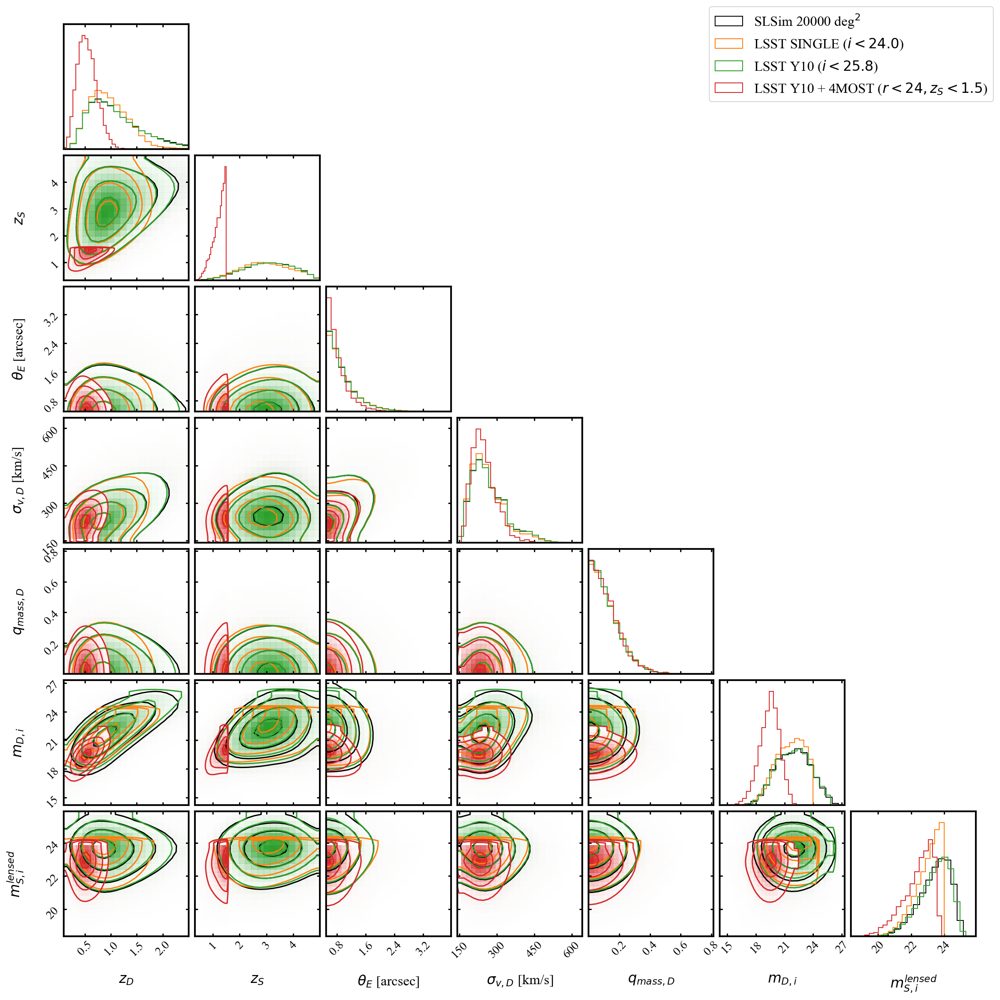

In [ ]:
###################################################################
### Make corner plot of the Original and 3 depth cut data sets
###################################################################

key_list = ['z_D',
            'z_S',
            'theta_E',
            'sigma_v_D',
            'e_mass_D',
            'mag_D_i', 
            'mag_S_i_lensed']
key_latex_labels = {
    'z_D': r'$z_D$',
    'z_S': r'$z_S$',
    'theta_E': r'$\theta_E$ [arcsec]',
    'sigma_v_D': r'$\sigma_{v, D}$ [km/s]',
    'e_mass_D': r'$q_{mass, D}$',
    'mag_D_i': r'$m_{D, i}$',
    'mag_S_i_lensed': r'$m_{S, i}^{lensed}$',
}



data_corner = [GGL_data_table[key] for key in key_list]
data_corner = np.array(data_corner).T

data_corner_SINGLE = [samples['lsst_single_visit']['table'][key] for key in key_list]
data_corner_SINGLE = np.array(data_corner_SINGLE).T

data_corner_Y10 = [samples['lsst_y10']['table'][key] for key in key_list]
data_corner_Y10 = np.array(data_corner_Y10).T

data_corner_4MOST = [samples['lsst_4most']['table'][key] for key in key_list]
data_corner_4MOST = np.array(data_corner_4MOST).T

fig_corner = corner.corner(
    data_corner,
    labels=[key_latex_labels[key] for key in key_list],
    hist_kwargs={"density": True},
    # show_titles=True,
    smooth=2,
    # smooth1d=True,
    plot_datapoints=False,
);

corner.corner(
    data_corner_SINGLE,
    labels=[key_latex_labels[key] for key in key_list],
    hist_kwargs={"density": True},
    color=samples['lsst_single_visit']['color'],
    smooth=2,
    fig=fig_corner,
    plot_datapoints=False,
);

corner.corner(
    data_corner_Y10,
    labels=[key_latex_labels[key] for key in key_list],
    hist_kwargs={"density": True},
    color=samples['lsst_y10']['color'],
    smooth=2,
    fig=fig_corner,
    plot_datapoints=False,
);

corner.corner(
    data_corner_4MOST,
    labels=[key_latex_labels[key] for key in key_list],
    hist_kwargs={"density": True},
    color=samples['lsst_4most']['color'],
    smooth=2,
    fig=fig_corner,
    plot_datapoints=False,
);

fig_corner.legend(
    ['SLSim 20000 deg$^2$',
     samples['lsst_single_visit']['label'],
     samples['lsst_y10']['label'],
     samples['lsst_4most']['label']],
    loc='upper right',
    fontsize=16
)

# make the font size of the labels and titles larger
for ax in fig_corner.get_axes():
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel(ax.get_xlabel(), fontsize=16)
    ax.set_ylabel(ax.get_ylabel(), fontsize=16)
    ax.set_title(ax.get_title(), fontsize=16)

fig_corner.savefig(f"../figures/slsim_corner_all_samples.png", bbox_inches='tight', dpi=300)
fig_corner.savefig(f"../figures/slsim_corner_all_samples.pdf", bbox_inches='tight', dpi=300)

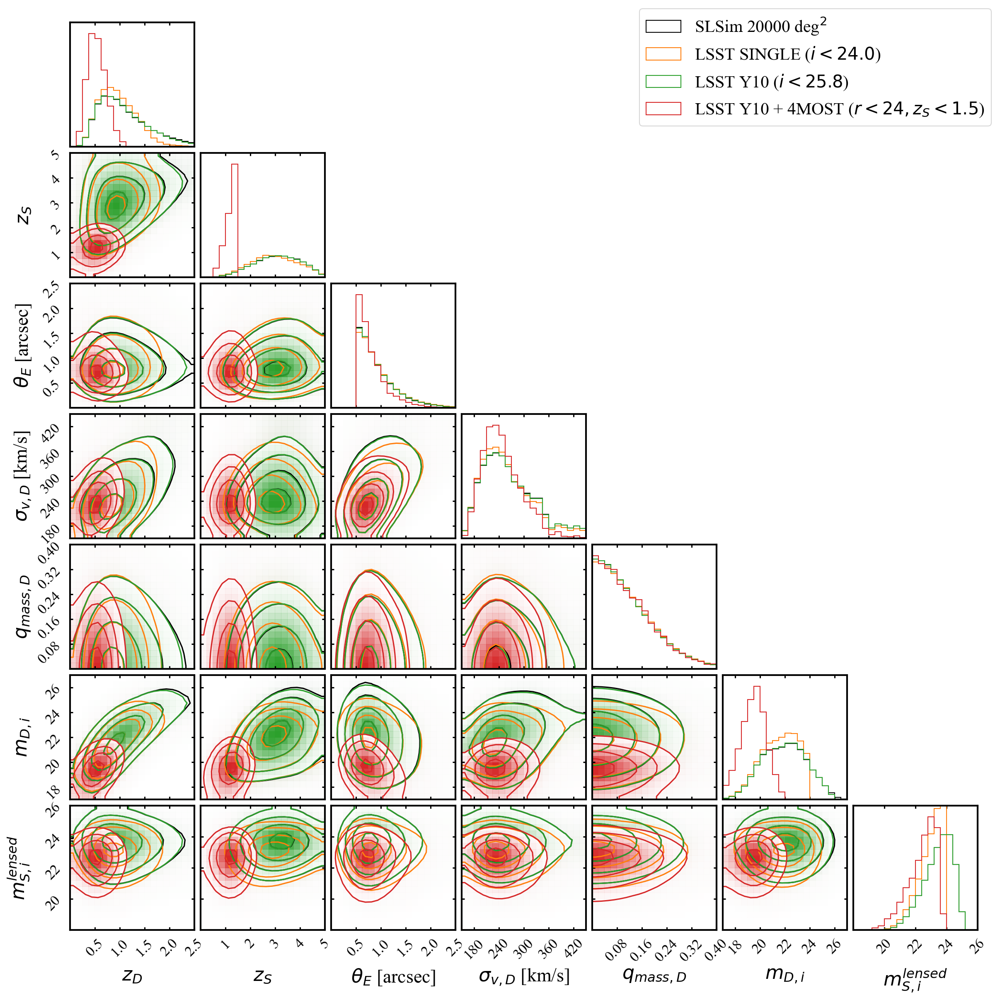

In [ ]:
###################################################################
### Make corner plot of the Original and 3 depth cut data sets
###################################################################

key_list = ['z_D',
            'z_S',
            'theta_E',
            'sigma_v_D',
            'e_mass_D',
            'mag_D_i', 
            'mag_S_i_lensed']
key_latex_labels = {
    'z_D': r'$z_D$',
    'z_S': r'$z_S$',
    'theta_E': r'$\theta_E$ [arcsec]',
    'sigma_v_D': r'$\sigma_{v, D}$ [km/s]',
    'e_mass_D': r'$q_{mass, D}$',
    'mag_D_i': r'$m_{D, i}$',
    'mag_S_i_lensed': r'$m_{S, i}^{lensed}$',
}


data_corner = [GGL_data_table[key] for key in key_list]
data_corner = np.array(data_corner).T

data_corner_SINGLE = [samples['lsst_single_visit']['table'][key] for key in key_list]
data_corner_SINGLE = np.array(data_corner_SINGLE).T

data_corner_Y10 = [samples['lsst_y10']['table'][key] for key in key_list]
data_corner_Y10 = np.array(data_corner_Y10).T

data_corner_4MOST = [samples['lsst_4most']['table'][key] for key in key_list]
data_corner_4MOST = np.array(data_corner_4MOST).T

# --- Define plot ranges based on the reference image ---
plot_ranges = [
    (0.0, 2.5),  # z_D
    (0.0, 5.0),  # z_S
    (0.0, 2.5),  # theta_E
    (150, 450),  # sigma_v_D
    (0, 0.4),  # e_mass_D
    (17, 27),    # mag_D_i
    (18, 26)     # mag_S_i_lensed
]

fig_corner = corner.corner(
    data_corner,
    labels=[key_latex_labels[key] for key in key_list],
    range=plot_ranges, 
    hist_kwargs={"density": True},
    smooth=2,
    plot_datapoints=False,
);

corner.corner(
    data_corner_SINGLE,
    labels=[key_latex_labels[key] for key in key_list],
    range=plot_ranges, 
    hist_kwargs={"density": True},
    color=samples['lsst_single_visit']['color'],
    smooth=2,
    fig=fig_corner,
    plot_datapoints=False,
);

corner.corner(
    data_corner_Y10,
    labels=[key_latex_labels[key] for key in key_list],
    range=plot_ranges, 
    hist_kwargs={"density": True},
    color=samples['lsst_y10']['color'],
    smooth=2,
    fig=fig_corner,
    plot_datapoints=False,
);

corner.corner(
    data_corner_4MOST,
    labels=[key_latex_labels[key] for key in key_list],
    range=plot_ranges, 
    hist_kwargs={"density": True},
    color=samples['lsst_4most']['color'],
    smooth=2,
    fig=fig_corner,
    plot_datapoints=False,
);

fig_corner.legend(
    ['SLSim 20000 deg$^2$',
     samples['lsst_single_visit']['label'],
     samples['lsst_y10']['label'],
     samples['lsst_4most']['label']],
    loc='upper right',
    fontsize=20  # Increased legend font size
)

# make the font size of the labels and titles larger
for ax in fig_corner.get_axes():
    # Increase tick label size and add padding
    ax.tick_params(axis='both', which='major', labelsize=17, pad=8)
    
    # Increase axis label size
    ax.xaxis.label.set_size(22)
    ax.yaxis.label.set_size(22)
    
    # Increase title size (for 1D histograms)
    ax.title.set_size(22)

# fig_corner.savefig(f"../figures/slsim_corner_GGL_all_samples.png", bbox_inches='tight', dpi=300)
fig_corner.savefig(f"../figures/slsim_corner_GGL_all_samples.pdf", bbox_inches='tight', dpi=300)

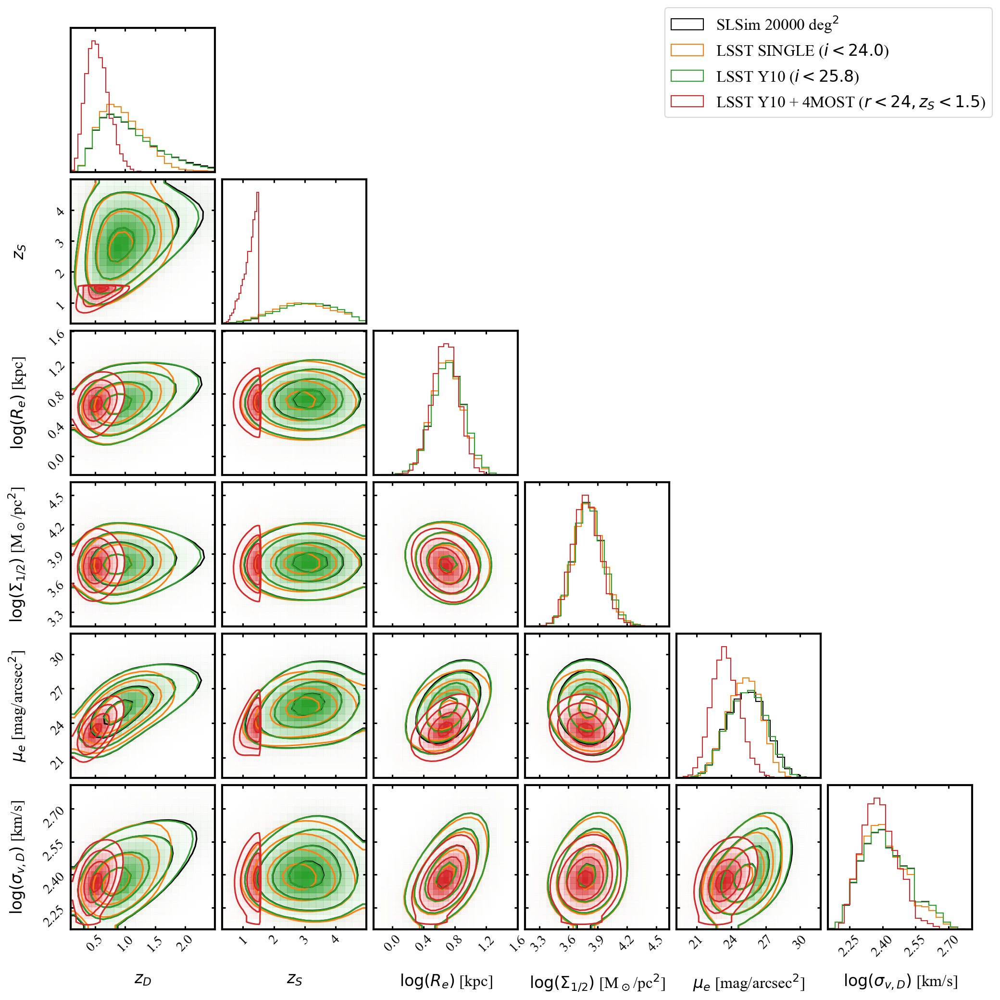

In [ ]:
###################################################################
### Make corner plot of the Original and 3 depth cut data sets
### Here with FP and MFP parameters
###################################################################
key_list = ['z_D',
            'z_S',
            'log_R_e_kpc', 
            'log_Sigma_half_Msun/pc2', 
            'surf_bri_mag/arcsec2',
            'log_sigma_v_D', 
            # 'mag_D_r', 
            # 'mag_S_r_lensed'
            ]
key_latex_labels = {
    'z_D': r'$z_D$',
    'z_S': r'$z_S$',
    'log_R_e_kpc': r'$\log(R_e)$ [kpc]',
    'log_Sigma_half_Msun/pc2': r'$\log(\Sigma_{1/2})$ [M$_\odot$/pc$^2$]',
    'surf_bri_mag/arcsec2': r'$\mu_e$ [mag/arcsec$^2$]',
    'log_sigma_v_D': r'$\log(\sigma_{v, D})$ [km/s]',
    # 'mag_D_r': r'$m_{D, r}$',
    # 'mag_S_r': r'$m_{S, r}$',
    # 'mag_S_r_lensed': r'$m_{S, r}^{lensed}$'
}



data_corner = [GGL_data_table[key] for key in key_list]
data_corner = np.array(data_corner).T

data_corner_SINGLE = [samples['lsst_single_visit']['table'][key] for key in key_list]
data_corner_SINGLE = np.array(data_corner_SINGLE).T

data_corner_Y10 = [samples['lsst_y10']['table'][key] for key in key_list]
data_corner_Y10 = np.array(data_corner_Y10).T

data_corner_4MOST = [samples['lsst_4most']['table'][key] for key in key_list]
data_corner_4MOST = np.array(data_corner_4MOST).T

fig_corner = corner.corner(
    data_corner,
    labels=[key_latex_labels[key] for key in key_list],
    hist_kwargs={"density": True},
    # show_titles=True,
    smooth=2,
    # smooth1d=True,
    plot_datapoints=False,
);

corner.corner(
    data_corner_SINGLE,
    labels=[key_latex_labels[key] for key in key_list],
    hist_kwargs={"density": True},
    color=samples['lsst_single_visit']['color'],
    smooth=2,
    fig=fig_corner,
    plot_datapoints=False,
);

corner.corner(
    data_corner_Y10,
    labels=[key_latex_labels[key] for key in key_list],
    hist_kwargs={"density": True},
    color=samples['lsst_y10']['color'],
    smooth=2,
    fig=fig_corner,
    plot_datapoints=False,
);

corner.corner(
    data_corner_4MOST,
    labels=[key_latex_labels[key] for key in key_list],
    hist_kwargs={"density": True},
    color=samples['lsst_4most']['color'],
    smooth=2,
    fig=fig_corner,
    plot_datapoints=False,
);

fig_corner.legend(
    ['SLSim 20000 deg$^2$',
     samples['lsst_single_visit']['label'],
     samples['lsst_y10']['label'],
     samples['lsst_4most']['label']],
    loc='upper right',
    fontsize=16
)

# make the font size of the labels and titles larger
for ax in fig_corner.get_axes():
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel(ax.get_xlabel(), fontsize=16)
    ax.set_ylabel(ax.get_ylabel(), fontsize=16)
    ax.set_title(ax.get_title(), fontsize=16)


## Mass Fundamental Planes of the SLSim Lenses in various LSST-like samples

LSST SINGLE ($i < 24.0$) sigma_v scatter (MFP): 6.38 %
LSST Y10 ($i < 25.8$) sigma_v scatter (MFP): 6.29 %
LSST Y10 + 4MOST ($r < 24, z_S < 1.5$) sigma_v scatter (MFP): 4.72 %


/var/folders/4r/jq9w4fy92y9_bqzvdfk2d5h40000gn/T/ipykernel_33987/2732293401.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


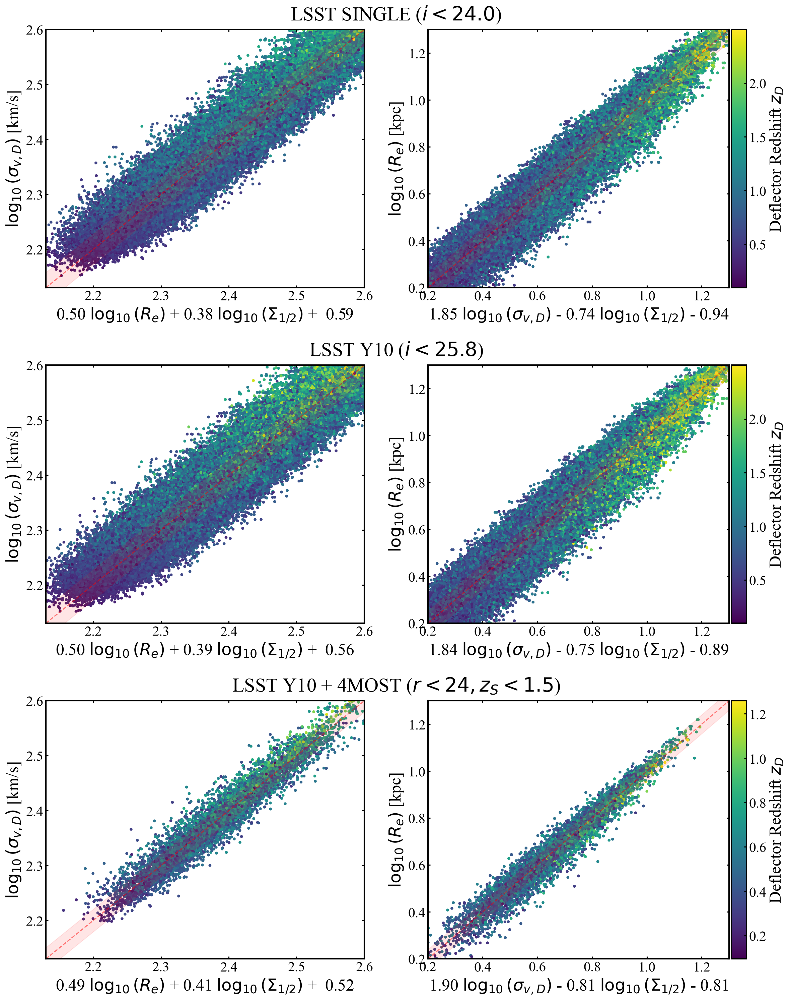

In [ ]:
########################################################
### Plot the MFP for all samples in a single figure
########################################################

# Determine number of rows from the samples dictionary
# (Assuming 3 rows as requested)
num_rows = len(samples)

# Define fixed limits for all plots
xlim_left = (2.13, 2.6)
ylim_left = (2.13, 2.6)
xlim_right = (0.2, 1.3)
ylim_right = (0.2, 1.3)

# Create a single figure with `num_rows` rows and 2 columns
# Adjust figsize height based on the number of rows (e.g., 8 inches per row)
fig, axs = plt.subplots(num_rows, 2, figsize=(18, 8 * num_rows), 
                        gridspec_kw={'hspace': 0.3})

# Ensure axs is always a 2D array, even if num_rows is 1
if num_rows == 1:
    axs = np.array([axs])

# Loop over the samples and plot in the corresponding row
for i, (key, s) in enumerate(samples.items()):
    data_table = s["table"]
    title = s["label"]

    # --- Calculations (copied from original) ---
    # fit the MFP
    coeffs_MFP = fit_plane(
        np.log10(data_table["R_e_kpc"]),
        np.log10(data_table["Sigma_half_Msun/pc2"]),
        np.log10(data_table["sigma_v_D"])
    )

    # find the scatter
    scatter_MFP = find_scatter(
        np.log10(data_table["R_e_kpc"]),
        np.log10(data_table["Sigma_half_Msun/pc2"]),
        np.log10(data_table["sigma_v_D"]),
        coeffs_MFP,
        return_fit=False
    )

    # fit the MFP with R_e as the dependent variable
    coeffs_MFP_alt = fit_plane(
        np.log10(data_table["sigma_v_D"]),
        np.log10(data_table["Sigma_half_Msun/pc2"]),
        np.log10(data_table["R_e_kpc"])
    )

    # find the scatter
    scatter_MFP_alt = find_scatter(
        np.log10(data_table["sigma_v_D"]),
        np.log10(data_table["Sigma_half_Msun/pc2"]),
        np.log10(data_table["R_e_kpc"]),
        coeffs_MFP_alt,
        return_fit=False
    )

    # print the scatter in percentage
    print(title, "sigma_v scatter (MFP):", np.round(np.std(scatter_MFP) * np.log(10) * 100, 2), "%")

    # --- Plotting ---
    # Get the axes for the current row
    ax_left = axs[i, 0]
    ax_right = axs[i, 1]

    # --- Set Limits
    ax_left.set_xlim(xlim_left)
    ax_left.set_ylim(ylim_left)
    ax_right.set_xlim(xlim_right)
    ax_right.set_ylim(ylim_right)

    # --- Left Plot: sigma_v mass fundamental plane ---
    ax_left.scatter(
        coeffs_MFP[0] * np.log10(data_table["R_e_kpc"]) +
        coeffs_MFP[1] * np.log10(data_table["Sigma_half_Msun/pc2"]) +
        coeffs_MFP[2],
        np.log10(data_table["sigma_v_D"]),
        c=data_table["z_D"], s=10, label='SLSim MFP',
        cmap='viridis'
    )
    ax_left.set_xlabel(f'{coeffs_MFP[0]:.2f} ' + r'$\log_{10}(R_e)$ + ' + f'{coeffs_MFP[1]:.2f} ' + r'$\log_{10}(\Sigma_{1/2})$ + ' + f' {coeffs_MFP[2]:.2f}')
    ax_left.set_ylabel(r'$\log_{10}(\sigma_{v, D})$ [km/s]')

    # Set the row title
    ax_left.set_title(title, fontsize=28, x = 1.1, y=1.02)

    # Plot the y=x line and faded scatter region (using fixed limits)
    ax_left.plot(xlim_left, ylim_left, color='red', linestyle='--', alpha=0.5, label='y = x')
    x_faded = np.linspace(xlim_left[0], xlim_left[1], 100)
    y_faded = x_faded
    ax_left.fill_between(x_faded, y_faded - np.std(scatter_MFP),
                         y_faded + np.std(scatter_MFP), color='red', alpha=0.1)

    # --- Right Plot: R_e mass fundamental plane ---
    scatter_plot = ax_right.scatter(
        coeffs_MFP_alt[0] * np.log10(data_table["sigma_v_D"]) +
        coeffs_MFP_alt[1] * np.log10(data_table["Sigma_half_Msun/pc2"]) +
        coeffs_MFP_alt[2],
        np.log10(data_table["R_e_kpc"]),
        c=data_table["z_D"], s=10, label='SLSim MFP',
        cmap='viridis'
    )
    ax_right.set_xlabel(f'{coeffs_MFP_alt[0]:.2f} ' + r'$\log_{10}(\sigma_{v, D})$ ' + f'{'+' if coeffs_MFP_alt[1] > 0 else '-'} {np.abs(coeffs_MFP_alt[1]):.2f} ' + r'$\log_{10}(\Sigma_{1/2})$ ' + f'{'+' if coeffs_MFP_alt[2] > 0 else '-'} {np.abs(coeffs_MFP_alt[2]):.2f}')
    ax_right.set_ylabel(r'$\log_{10}(R_e)$ [kpc]')

    # Plot the y=x line and faded scatter region (using fixed limits)
    ax_right.plot(xlim_right, ylim_right, color='red', linestyle='--', alpha=0.5, label='y = x')
    x_faded = np.linspace(xlim_right[0], xlim_right[1], 100)
    y_faded = x_faded
    ax_right.fill_between(x_faded, y_faded - np.std(scatter_MFP_alt),
                          y_faded + np.std(scatter_MFP_alt), color='red', alpha=0.1)

    # --- Colorbar (one per row, attached to the right plot) ---
    divider = make_axes_locatable(ax_right)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(scatter_plot, cax=cax)
    
    # cbar label size (matching original)
    cbar.set_label('Deflector Redshift $z_D$', fontsize=24)
    
    # cbar tick labels (matching original)
    cbar.ax.tick_params(labelsize=20)

    # --- Formatting (applied to both plots in the row) ---
    for ax in [ax_left, ax_right]:
        ax.tick_params(axis='both', which='major', labelsize=20)
        ax.set_xlabel(ax.get_xlabel(), fontsize=24)
        ax.set_ylabel(ax.get_ylabel(), fontsize=24)
        # ax.set_title(ax.get_title(), fontsize=24) # Title is already set on the left
        # ax.legend(fontsize=14) # Original was commented out

fig.tight_layout()

fig.savefig(f"../figures/slsim_MFP_all_samples.png", bbox_inches='tight', dpi=300)
fig.savefig(f"../figures/slsim_MFP_all_samples.pdf", bbox_inches='tight', dpi=300)

## Traditional Fundamental Planes of the SLSim Lenses in various LSST-like samples

LSST SINGLE ($i < 24.0$) sigma_v scatter (FP): 14.37 %
LSST Y10 ($i < 25.8$) sigma_v scatter (FP): 14.54 %
LSST Y10 + 4MOST ($r < 24, z_S < 1.5$) sigma_v scatter (FP): 13.04 %


/var/folders/4r/jq9w4fy92y9_bqzvdfk2d5h40000gn/T/ipykernel_33987/98747126.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


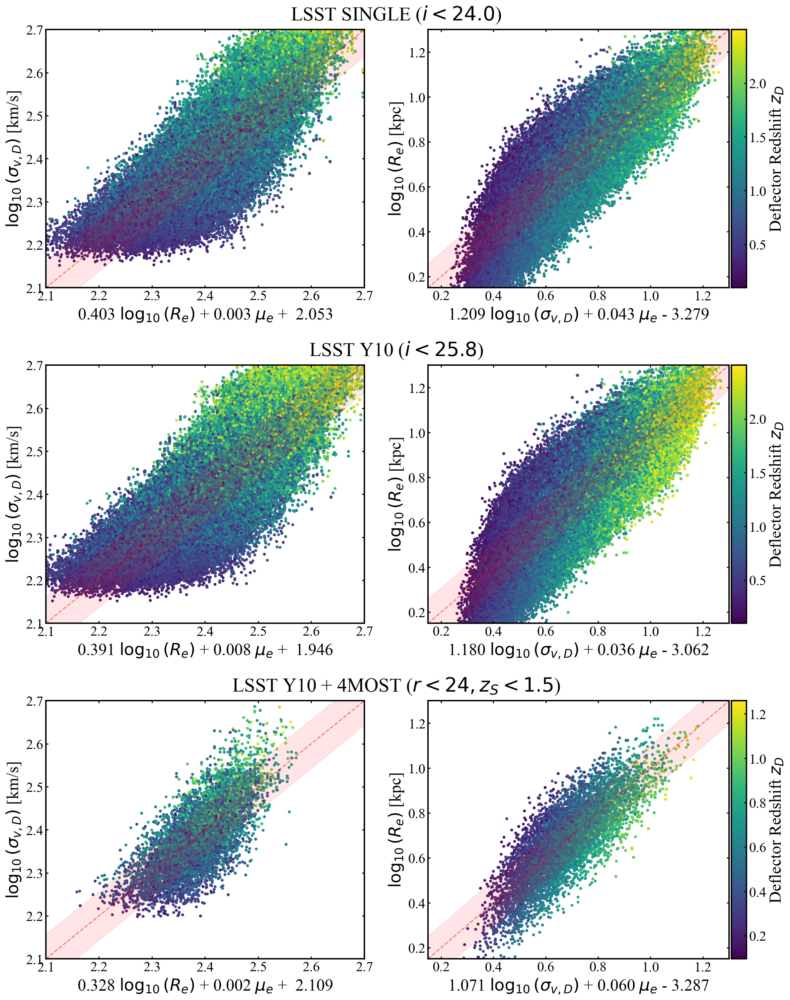

In [37]:
#################################################################
### Plot the Traditional FP for all samples in a single figure
#################################################################

# Determine number of rows from the samples dictionary
num_rows = len(samples)

# Create a single figure with `num_rows` rows and 2 columns
# (Style copied from the MFP plot example)
fig, axs = plt.subplots(num_rows, 2, figsize=(18, 8 * num_rows), 
                        gridspec_kw={'hspace': 0.3})

# Ensure axs is always a 2D array, even if num_rows is 1
if num_rows == 1:
    axs = np.array([axs])

# Define fixed limits from the original code for robust plotting
xlim_left = (2.1, 2.7)
ylim_left = (2.1, 2.7)
xlim_right = (0.15, 1.3)
ylim_right = (0.15, 1.3)

# Loop over the samples and plot in the corresponding row
for i, (key, s) in enumerate(samples.items()):
    data_table = s["table"]
    title = s["label"]
    
    # --- Calculations (for Traditional FP) ---
    # fit the FP
    coeffs_MFP = fit_plane(
        np.log10(data_table["R_e_kpc"]),
        data_table["surf_bri_mag/arcsec2"],
        np.log10(data_table["sigma_v_D"])
    )

    # find the scatter
    scatter_MFP = find_scatter(
        np.log10(data_table["R_e_kpc"]),
        data_table["surf_bri_mag/arcsec2"],
        np.log10(data_table["sigma_v_D"]),
        coeffs_MFP,
        return_fit=False
    )

    # fit the FP with R_e as the dependent variable
    coeffs_MFP_alt = fit_plane(
        np.log10(data_table["sigma_v_D"]),
        data_table["surf_bri_mag/arcsec2"],
        np.log10(data_table["R_e_kpc"])
    )

    # find the scatter
    scatter_MFP_alt = find_scatter(
        np.log10(data_table["sigma_v_D"]),
        data_table["surf_bri_mag/arcsec2"],
        np.log10(data_table["R_e_kpc"]),
        coeffs_MFP_alt,
        return_fit=False
    )

    # print the scatter in percentage
    print(title, "sigma_v scatter (FP):", np.round(np.std(scatter_MFP) * np.log(10) * 100, 2), "%")

    # --- Plotting ---
    # Get the axes for the current row
    ax_left = axs[i, 0]
    ax_right = axs[i, 1]

    # Set Limits
    ax_left.set_xlim(xlim_left)
    ax_left.set_ylim(ylim_left)
    ax_right.set_xlim(xlim_right)
    ax_right.set_ylim(ylim_right)

    # --- Left Plot: sigma_v fundamental plane ---
    ax_left.scatter(
        coeffs_MFP[0] * np.log10(data_table["R_e_kpc"]) + 
        coeffs_MFP[1] * data_table["surf_bri_mag/arcsec2"] + 
        coeffs_MFP[2],
        np.log10(data_table["sigma_v_D"]),
        c=data_table["z_D"], s=10, label='SLSim FP', 
        cmap='viridis'
    )
    ax_left.set_xlabel(f'{coeffs_MFP[0]:.3f} ' + r'$\log_{10}(R_e)$ + ' + f'{coeffs_MFP[1]:.3f} ' + r'$\mu_e$ + ' + f' {coeffs_MFP[2]:.3f}')
    ax_left.set_ylabel(r'$\log_{10}(\sigma_{v, D})$ [km/s]')
    
    # Set the row title (style from example)
    ax_left.set_title(title, fontsize=28, x = 1.1, y=1.02)

    # Plot the fitted plane with a faded scatter (using get_xlim)
    # y = x
    ax_left.plot([ax_left.get_xlim()[0], ax_left.get_xlim()[1]],
                 [ax_left.get_xlim()[0], ax_left.get_xlim()[1]],
                 color='red', linestyle='--', alpha=0.5, label='y = x')
    # faded region for the scatter
    x_faded = np.linspace(ax_left.get_xlim()[0], ax_left.get_xlim()[1], 100)
    y_faded = x_faded
    ax_left.fill_between(x_faded, y_faded - np.std(scatter_MFP),
                         y_faded + np.std(scatter_MFP), color='red', alpha=0.1)

    # --- Right Plot: R_e fundamental plane ---
    scatter_plot = ax_right.scatter(
        coeffs_MFP_alt[0] * np.log10(data_table["sigma_v_D"]) + 
        coeffs_MFP_alt[1] * data_table["surf_bri_mag/arcsec2"] + 
        coeffs_MFP_alt[2],
        np.log10(data_table["R_e_kpc"]),
        c=data_table["z_D"], s=10, label='SLSim FP', 
        cmap='viridis'
    )
    ax_right.set_xlabel(f'{coeffs_MFP_alt[0]:.3f} ' + r'$\log_{10}(\sigma_{v, D})$ ' + f'{'+' if coeffs_MFP_alt[1] > 0 else '-'} {np.abs(coeffs_MFP_alt[1]):.3f} ' + r'$\mu_e$ ' + f'{'+' if coeffs_MFP_alt[2] > 0 else '-'} {np.abs(coeffs_MFP_alt[2]):.3f}')
    ax_right.set_ylabel(r'$\log_{10}(R_e)$ [kpc]')
    
    # Plot the fitted plane with a faded scatter (using get_xlim)
    # y = x
    ax_right.plot([ax_right.get_xlim()[0], ax_right.get_xlim()[1]],
                  [ax_right.get_xlim()[0], ax_right.get_xlim()[1]],
                  color='red', linestyle='--', alpha=0.5, label='y = x')
    # faded region for the scatter
    x_faded = np.linspace(ax_right.get_xlim()[0], ax_right.get_xlim()[1], 100)
    y_faded = x_faded
    ax_right.fill_between(x_faded, y_faded - np.std(scatter_MFP_alt),
                          y_faded + np.std(scatter_MFP_alt), color='red', alpha=0.1)

    # --- Colorbar (one per row, attached to the right plot) ---
    divider = make_axes_locatable(ax_right)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(scatter_plot, cax=cax)
    cbar.set_label('Deflector Redshift $z_D$', fontsize=24) # Fontsize from example
    
    # cbar tick labels (matching original)
    cbar.ax.tick_params(labelsize=20)

    # --- Formatting (applied to both plots in the row) ---
    for ax in [ax_left, ax_right]:
        ax.tick_params(axis='both', which='major', labelsize=20)
        ax.set_xlabel(ax.get_xlabel(), fontsize=24)
        ax.set_ylabel(ax.get_ylabel(), fontsize=24)
        # ax.legend(fontsize=14)

# Apply tight layout to the whole figure
fig.tight_layout()

# Save the figure
fig.savefig(f"../figures/slsim_FP_all_samples.pdf", bbox_inches='tight', dpi=300)
fig.savefig(f"../figures/slsim_FP_all_samples.png", bbox_inches='tight', dpi=300)

## Latex Table for various samples, their MFP and FP parameters

In [44]:
########################################################
## Latex Table Summary of all samples
## Columns are: Sample, # Lenses, Selection Criteria
########################################################

print("Latex Table Summary:")
print("\n")

# Use r"..." for raw strings to correctly handle backslashes
print(r"\begin{tabular}{l c c}")
print(r"\hline")
# This line is now correct: \t is not a tab, and \# is a hash
print(r"\textbf{Sample} & \textbf{\# Lenses} & \textbf{Selection Criteria} \\")
print(r"\hline")

# Your f-string escaping was already correct.
# {{i}} prints {i}
# \\mu prints \mu
# \\\\ prints \\
# print(f"SLSim 20000 deg$^2$ & {len(GGL_data_table)} &"+ " $m_{i} < 28.0$, $\\mu_{\\rm tot} > 3$, $1'' < \\Delta \\theta < 8''$,\\\\ & & contrast ratio $> 2$, $m_{i}^{\\rm 2^{\\rm nd} \\ brightest} < 26$\\\\")
print(f"\\multirow{{2}}{{*}}{{SLSim 20000 deg$^2$}} & \\multirow{{2}}{{*}}{{{len(GGL_data_table)}}} &"+ " $m_{i} < 28.0$, $\\mu_{\\rm tot} > 3$, $1'' < \\Delta \\theta < 8''$,\\\\")
print(r" & & contrast ratio $> 2$, $m_{i}^{\rm 2^{\rm nd} \ brightest} < 26$\\\\")

for key, s in samples.items():
    # This f-string also needs \\\\ to print a LaTeX newline \\
    print(f"{s['name']} & {s['count']} & {s['selc_func_latex']} \\\\")

print(r"\hline")
print(r"\end{tabular}")

Latex Table Summary:


\begin{tabular}{l c c}
\hline
\textbf{Sample} & \textbf{\# Lenses} & \textbf{Selection Criteria} \\
\hline
\multirow{2}{*}{SLSim 20000 deg$^2$} & \multirow{2}{*}{322403} & $m_{i} < 28.0$, $\mu_{\rm tot} > 3$, $1'' < \Delta \theta < 8''$,\\
 & & contrast ratio $> 2$, $m_{i}^{\rm 2^{\rm nd} \ brightest} < 26$\\\\
LSST SINGLE & 188902 & $m_{i} < 24.0$ \\
LSST Y10 & 319925 & $m_{i} < 25.8$ \\
LSST Y10 + 4MOST & 8246 & $m_{r} < 24.0, z_S < 1.5$ \\
\hline
\end{tabular}


In [48]:
########################################################
## Estimate the fitting parameters and their errors for the MFP and FP for each sample
## attach to the sample dictionary
########################################################

## sigma_v as dependent variable
for key, s in samples.items():
    data_table = s["table"]
    title = s["label"]
    
    # --- MFP ---
    # fit the MFP
    coeffs_MFP = fit_plane(
        np.log10(data_table["R_e_kpc"]),
        np.log10(data_table["Sigma_half_Msun/pc2"]),
        np.log10(data_table["sigma_v_D"])
    )
    s['MFP_coeffs'] = coeffs_MFP
    # find the scatter
    scatter_MFP = find_scatter(
        np.log10(data_table["R_e_kpc"]),
        np.log10(data_table["Sigma_half_Msun/pc2"]),
        np.log10(data_table["sigma_v_D"]),
        coeffs_MFP,
        return_fit=False
    )
    s['MFP_sigma_v_scatter'] = np.std(scatter_MFP)

    # --- FP ---
    # fit the FP
    coeffs_FP = fit_plane(
        np.log10(data_table["R_e_kpc"]),
        data_table["surf_bri_mag/arcsec2"],
        np.log10(data_table["sigma_v_D"])
    )
    s['FP_coeffs'] = coeffs_FP
    # find the scatter
    scatter_FP = find_scatter(
        np.log10(data_table["R_e_kpc"]),
        data_table["surf_bri_mag/arcsec2"],
        np.log10(data_table["sigma_v_D"]),
        coeffs_FP,
        return_fit=False
    )
    s['FP_sigma_v_scatter'] = np.std(scatter_FP)

## R_e as dependent variable
for key, s in samples.items():
    data_table = s["table"]
    title = s["label"]
    
    # --- MFP ---
    # fit the MFP
    coeffs_MFP_alt = fit_plane(
        np.log10(data_table["sigma_v_D"]),
        np.log10(data_table["Sigma_half_Msun/pc2"]),
        np.log10(data_table["R_e_kpc"])
    )
    s['MFP_coeffs_alt'] = coeffs_MFP_alt
    # find the scatter
    scatter_MFP_alt = find_scatter(
        np.log10(data_table["sigma_v_D"]),
        np.log10(data_table["Sigma_half_Msun/pc2"]),
        np.log10(data_table["R_e_kpc"]),
        coeffs_MFP_alt,
        return_fit=False
    )
    s['MFP_R_e_scatter'] = np.std(scatter_MFP_alt)

    # --- FP ---
    # fit the FP
    coeffs_FP_alt = fit_plane(
        np.log10(data_table["sigma_v_D"]),
        data_table["surf_bri_mag/arcsec2"],
        np.log10(data_table["R_e_kpc"])
    )
    s['FP_coeffs_alt'] = coeffs_FP_alt
    # find the scatter
    scatter_FP_alt = find_scatter(
        np.log10(data_table["sigma_v_D"]),
        data_table["surf_bri_mag/arcsec2"],
        np.log10(data_table["R_e_kpc"]),
        coeffs_FP_alt,
        return_fit=False
    )
    s['FP_R_e_scatter'] = np.std(scatter_FP_alt)

In [51]:
########################################################
## Latex Table: MFP and FP scatter and coefficients summary
########################################################
print("Latex Table Summary of MFP and FP fits (sigma_v as dependent):")
print("\n")
# Use r"..." for raw strings to correctly handle backslashes
print(r"\begin{tabular}{lcccccccc}")
print(r"    \toprule")
print(r"    \multirow{2}{*}{\textbf{Sample}} & \multicolumn{4}{c}{\textbf{FP}} & \multicolumn{4}{c}{\textbf{MFP}} \\")
print(r"    \cmidrule(lr){2-5} \cmidrule(lr){6-9}")
# Note: \% prints a percent sign, and $\sigma...$ is handled correctly in a raw string
print(r"     & \multirow{2}{*}{\shortstack{\% scatter \\ in $\sigma_{v, D}$}} & \multicolumn{3}{c}{coefficients} & \multirow{2}{*}{\shortstack{\% scatter \\ in $\sigma_{v, D}$}} & \multicolumn{3}{c}{coefficients} \\")
print(r"    \cmidrule(lr){3-5} \cmidrule(lr){7-9}")
print(r"     & & a & b & c & & a & b & c \\")
print(r"    \midrule")
for key, s in samples.items():
    fp_scatter_percent = np.round(s['FP_sigma_v_scatter'] * np.log(10) * 100, 2)
    mfp_scatter_percent = np.round(s['MFP_sigma_v_scatter'] * np.log(10) * 100, 2)
    fp_a, fp_b, fp_c = s['FP_coeffs']
    mfp_a, mfp_b, mfp_c = s['MFP_coeffs']
    print(f"    {s['name']} & {fp_scatter_percent} & {fp_a:.3f} & {fp_b:.3f} & {fp_c:.3f} & {mfp_scatter_percent} & {mfp_a:.3f} & {mfp_b:.3f} & {mfp_c:.3f} \\\\")
print(r"    \bottomrule")
print(r"\end{tabular}")


print("\n")
print("Latex Table Summary of MFP and FP fits (R_e as dependent):")
print("\n")
# Use r"..." for raw strings to correctly handle backslashes
print(r"\begin{tabular}{lcccccccc}")
print(r"    \toprule")
print(r"    \multirow{2}{*}{\textbf{Sample}} & \multicolumn{4}{c}{\textbf{FP}} & \multicolumn{4}{c}{\textbf{MFP}} \\")
print(r"    \cmidrule(lr){2-5} \cmidrule(lr){6-9}") 
print(r"     & \multirow{2}{*}{\shortstack{\% scatter \\ in $R_e$}} & \multicolumn{3}{c}{coefficients} & \multirow{2}{*}{\shortstack{\% scatter \\ in $R_e$}} & \multicolumn{3}{c}{coefficients} \\")
print(r"    \cmidrule(lr){3-5} \cmidrule(lr){7-9}")
print(r"     & & $\alpha$ & $\beta$ & $\gamma$ & & $\alpha$ & $\beta$ & $\gamma$ \\")
print(r"    \midrule")
for key, s in samples.items():
    fp_scatter_percent = np.round(s['FP_R_e_scatter'] * np.log(10) * 100, 2)
    mfp_scatter_percent = np.round(s['MFP_R_e_scatter'] * np.log(10) * 100, 2)
    fp_a, fp_b, fp_c = s['FP_coeffs_alt']
    mfp_a, mfp_b, mfp_c = s['MFP_coeffs_alt']
    print(f"    {s['name']} & {fp_scatter_percent} & {fp_a:.3f} & {fp_b:.3f} & {fp_c:.3f} & {mfp_scatter_percent} & {mfp_a:.3f} & {mfp_b:.3f} & {mfp_c:.3f} \\\\")
print(r"    \bottomrule")
print(r"\end{tabular}")

Latex Table Summary of MFP and FP fits (sigma_v as dependent):


\begin{tabular}{lcccccccc}
    \toprule
    \multirow{2}{*}{\textbf{Sample}} & \multicolumn{4}{c}{\textbf{FP}} & \multicolumn{4}{c}{\textbf{MFP}} \\
    \cmidrule(lr){2-5} \cmidrule(lr){6-9}
     & \multirow{2}{*}{\shortstack{\% scatter \\ in $\sigma_{v, D}$}} & \multicolumn{3}{c}{coefficients} & \multirow{2}{*}{\shortstack{\% scatter \\ in $\sigma_{v, D}$}} & \multicolumn{3}{c}{coefficients} \\
    \cmidrule(lr){3-5} \cmidrule(lr){7-9}
     & & a & b & c & & a & b & c \\
    \midrule
    LSST SINGLE & 14.37 & 0.403 & 0.003 & 2.053 & 6.38 & 0.497 & 0.385 & 0.595 \\
    LSST Y10 & 14.54 & 0.391 & 0.008 & 1.946 & 6.29 & 0.504 & 0.393 & 0.559 \\
    LSST Y10 + 4MOST & 13.04 & 0.328 & 0.002 & 2.109 & 4.72 & 0.490 & 0.405 & 0.521 \\
    \bottomrule
\end{tabular}


Latex Table Summary of MFP and FP fits (R_e as dependent):


\begin{tabular}{lcccccccc}
    \toprule
    \multirow{2}{*}{\textbf{Sample}} & \multicolumn{4}{c}{\textb